описание соревнования
https://ods.ai/tracks/aij2020/competitions/aij-noflood/rus

In [1]:
# импортируем все необходимые библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import lightgbm as lgb
import tsfel
import glob
import os
from io import StringIO
import re
import csv
from tempfile import NamedTemporaryFile
import shutil
import warnings
warnings.filterwarnings("ignore")
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn_pandas import DataFrameMapper
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer
from sklearn.neighbors import NearestNeighbors

from datetime import datetime, timedelta
import tqdm
import datetime as dtm
from sklearn.model_selection import GridSearchCV
pd.set_option("display.max_columns", 120)

C:\Users\Alexey\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### Загрузка необработанных данных

In [2]:
path_hydro = 'datasets/hydro/'

In [44]:
file_names_daily = glob.glob(path_hydro + '/*_daily.csv')
hydro = []
ksvo_converter = lambda ksvo: list(ksvo.split(','))
for file_name in file_names_daily:
    tempfile = NamedTemporaryFile('w+t', newline=None, delete=False)
    with open(file_name, 'r') as unedited_csv:
        writer = csv.writer(tempfile)
        new_row = ''    
        for row in unedited_csv:
            if row[42] == ';':
                new_row = row
            else: 
                new_row = row[:42] + ';' + row[43:]
            writer.writerow([new_row])
    sio = StringIO(open(tempfile.name).read().replace(' ','').replace('"',''))
    df = pd.read_csv(sio, usecols=[0, 1, 2, 3, 4, 5], names=['date', 'avr_lev', 'min_lev', 'max_lev', 'avr_wat_temp', 'KSVO'], \
                     parse_dates=[0], skiprows=[0,1,2,3], na_values=['****', '*****'], converters={'KSVO': ksvo_converter},\
                     delimiter=';', decimal='.')
    df['id'] = pd.to_numeric(file_name[16:20:1])
    hydro.append(df)
    tempfile.close()
    os.unlink(tempfile.name)
hydro = pd.concat(hydro, axis=0, ignore_index=True)

In [4]:
# Толщина льда, высота снега, место измерения
file_names_ice = glob.glob(path_hydro + '/*_ice.csv')
ice = []
for file_name in file_names_ice:
    sio = StringIO(open(file_name).read().replace(' ',''))
    df = pd.read_csv(sio, usecols=[0,1,2,3], names=['date','ice_thick','snow_hight','mes_place'], parse_dates=[0], \
                     skiprows=[0,1], delimiter=';', decimal='.')
    df['id'] = pd.to_numeric(file_name[16:20:1])
    ice.append(df)
ice = pd.concat(ice, axis=0, ignore_index=True)

In [5]:
# Расход воды дневной
# Проблема с 30 днями в каждом месяце
file_names_wvol_d = glob.glob(path_hydro + '/*_disch_d.csv')
wvol_d = []
date_parser = lambda date: pd.to_datetime(date, errors='coerce')
for file_name in file_names_wvol_d:
    sio = StringIO(open(file_name).read().replace(' ',''))
    df = pd.read_csv(sio, usecols=[0,1], names=['date','wvol'], parse_dates=[0], \
                     date_parser=date_parser, skiprows=[0,1], delimiter=';')
    df['id'] = pd.to_numeric(file_name[16:20:1])
    wvol_d.append(df)
wvol_d = pd.concat(wvol_d, axis=0, ignore_index=True)

In [6]:
# Расход воды месячный
file_names_wvol_m = glob.glob(path_hydro + '/*_disch_m.csv')
wvol_m = []
date_parser_= lambda date: pd.to_datetime(date, format='%m.%Y')
for file_name in file_names_wvol_m:
    sio = StringIO(open(file_name).read().replace(' ',''))
    df = pd.read_csv(sio, usecols=[0,1,2,3,4,5,6,7,8], \
                     names=['date',\
                            'min_mon_fr', '1st_day_min_fr', 'lst_day_min_fr', 'ncas_min_fr', \
                            'max_mon_fr', '1st_day_max_fr', 'lst_day_max_fr', 'ncas_max_fr'], \
                     parse_dates=[0], date_parser=date_parser_, skiprows=[0,1], delimiter=';')
    df['month'] = pd.DatetimeIndex(df['date']).month
    df['year'] = pd.DatetimeIndex(df['date']).year
    df['id'] = pd.to_numeric(file_name[16:20:1])
    wvol_m.append(df)
wvol_m = pd.concat(wvol_m, axis=0, ignore_index=True)

In [7]:
path_meteo = 'datasets/meteo/'

In [8]:
file_names_meteo = glob.glob(path_meteo + '/*.csv')
meteo = []
for file_name in file_names_meteo:
    df = pd.read_csv(file_name, delimiter=';', parse_dates=['time'])
    meteo.append(df)
meteo = pd.concat(meteo, axis=0, ignore_index=True)  

In [9]:
hydro_18_20 = pd.read_csv('datasets/hydro_2018-2020/new_data_all.csv', delimiter=';', parse_dates=['time'])

In [10]:
hydro_coords = pd.read_pickle('datasets/processed_data/station_coords.pkl')

In [11]:
meteo_coords = pd.read_pickle('datasets/processed_data/meteo_coords.pkl')

In [12]:
point_descr = pd.read_pickle('datasets/processed_data/asunp.pkl')

### Визуализация геоданных

In [13]:
import folium
import elevation
import ee
ee.Initialize()
import tifffile as tiff
import os
import rasterio
from rasterio.warp import reproject, Resampling
from rasterio.transform import from_bounds, from_origin

In [14]:
target_st_id = [6005, 6022, 6027, 5004, 5012, 5024, 5805]

In [15]:
# Define a method for displaying Earth Engine image tiles to folium map.
def add_ee_layer(self, ee_image_object, vis_params, name):
    map_id_dict = ee.Image(ee_image_object).getMapId(vis_params)
    folium.raster_layers.TileLayer(
    tiles = map_id_dict['tile_fetcher'].url_format,
    attr = "Map Data © Google Earth Engine",
    name = name,
    overlay = True,
    control = True
    ).add_to(self)

# Add EE drawing method to folium.
folium.Map.add_ee_layer = add_ee_layer

# Fetch an elevation model.
dem = ee.Image('USGS/SRTMGL1_003')
# Set visualization parameters.
vis_params = {
  'min': 0,
  'max': 4000,
  'palette': ['006633', 'E5FFCC', '662A00', 'D8D8D8', 'F5F5F5']}

# Create a folium map object.
m = folium.Map(location=[50, 130], zoom_start=5, height=500)

# Add the elevation model to the map object.
m.add_ee_layer(dem.updateMask(dem.gt(0)), vis_params, 'DEM')

# Add a layer control panel to the map.
m = m.add_child(folium.LayerControl())

In [16]:
# Карта с пунктами наблюдений

elev_lst_hydro = []
for index, item in hydro_coords.iterrows():
    loc = item.get(['lat', 'lon'])
    name = item.get('station_id')
    xy = ee.Geometry.Point([loc[1], loc[0]])
    elev = dem.sample(xy, 30).first().get('elevation').getInfo() 
    elev_lst_hydro.append(elev)
    label = str(name) + str(' ') + str(elev) + str('m')
    if name in target_st_id:
        folium.Marker(location = loc, popup = label).add_to(m)
    else: 
        folium.CircleMarker(location = loc, popup = label, radius=3, weight=2, color='royalblue').add_to(m)
hydro_coords['elev'] = elev_lst_hydro
        
elev_lst_meteo = []
for index, item in meteo_coords.iterrows():
    loc = item.get(['lat', 'lon'])
    name = item.get('meteo_id')
    xy = ee.Geometry.Point([loc[1], loc[0]])
    elev = dem.sample(xy, 30).first().get('elevation').getInfo() 
    elev_lst_meteo.append(elev)
    label = str(name) + str(' ') + str(elev) + str('m')
    folium.CircleMarker(location = loc, popup = label, radius=1, weight=2, color='deeppink').add_to(m)
meteo_coords['elev'] = elev_lst_meteo

In [17]:
display(m)

In [18]:
meteo_coords = meteo_coords.reset_index().drop(['index', 'coords'], axis = 1)

In [19]:
# Таблица с данными по координатам, в т.ч. высотах над уровнем моря
coords_df = pd.concat([hydro_coords[['station_id', 'lat', 'lon', 'elev']], meteo_coords[['meteo_id', 'lat', 'lon', 'elev']].\
                          rename(columns={'meteo_id': 'station_id'})]).rename(columns={'station_id': 'id'}).reset_index()\
                        .drop('index', axis=1)

In [20]:
# Таблица с координатами
coords_df

,id,lat,lon,elev
0,5674,48.72,132.80,101
1,5216,44.06,132.01,98
2,6256,52.17,126.58,193
3,5132,44.23,134.27,1026
4,5151,43.57,133.04,655
...,...,...,...,...
298,5171761,51.65,117.57,679
299,5202771,51.98,127.65,283
300,5313301,53.07,132.98,488
301,5313301,53.08,132.93,553


In [21]:
n_hydro = hydro_coords['station_id'].nunique()
n_meteo = meteo_coords['station_id'].nunique()
n_target = len(target_st_id)
print('Количество гидропостов' + ' ' + str(n_hydro))
print('Из них' + ' ' + str(n_target) + ' ' + 'целевых')
print('Количество метеостанций' + ' ' + str(n_meteo))

Количество гидропостов 189
Из них 7 целевых
Количество метеостанций 109


### Сведение данных

In [22]:
# Присоединение данных о высоте над уровнем моря
#data = hydro.merge(elevation_df, how='left')

https://stackoverflow.com/questions/19412462/getting-distance-between-two-points-based-on-latitude-longitude

In [23]:
"""
# Привязка метеостанций к целевым гидропостам
neig = NearestNeighbors(n_neighbors=5, metric = 'haversine')
neig.fit(np.radians(meteo_coords[['lat', 'lon']].to_numpy()))
meteo_aff_dict = {}
for target in target_st_id:
    target_coord = np.radians(hydro_coords[hydro_coords['station_id'] == target][['lat', 'lon']].to_numpy())
    meteo_ind = neig.kneighbors(target_coord)[1].flatten().tolist()
    meteo_ids = [meteo_coords.iloc[i]['meteo_id'] for i in meteo_ind]
    meteo_aff_dict[target] = meteo_ids
meteo_aff_dict    
"""

"\n# Привязка метеостанций к целевым гидропостам\nneig = NearestNeighbors(n_neighbors=5, metric = 'haversine')\nneig.fit(np.radians(meteo_coords[['lat', 'lon']].to_numpy()))\nmeteo_aff_dict = {}\nfor target in target_st_id:\n    target_coord = np.radians(hydro_coords[hydro_coords['station_id'] == target][['lat', 'lon']].to_numpy())\n    meteo_ind = neig.kneighbors(target_coord)[1].flatten().tolist()\n    meteo_ids = [meteo_coords.iloc[i]['meteo_id'] for i in meteo_ind]\n    meteo_aff_dict[target] = meteo_ids\nmeteo_aff_dict    \n"

In [24]:
# Привязка метеостанций к гидропостам
neig = NearestNeighbors(n_neighbors=2, metric = 'haversine')
neig.fit(np.radians(meteo_coords[['lat', 'lon']].to_numpy()))
hydro_ids = hydro_coords['station_id'].unique()
meteo_aff_dict = {}
for hydro_id in hydro_ids:
    hydro_coord = np.radians(hydro_coords[hydro_coords['station_id'] == hydro_id][['lat', 'lon']].to_numpy())
    meteo_ind = neig.kneighbors(hydro_coord)[1].flatten().tolist()
    meteo_ids = [meteo_coords.iloc[i]['meteo_id'] for i in meteo_ind]
    meteo_aff_dict[hydro_id] = meteo_ids
meteo_aff_dict 

{5674: [4943321, 5013211],
 5216: [4433241, 4443211],
 6256: [5172691, 5202771],
 5132: [4483421, 4423391],
 5151: [4393311, 4433331],
 5458: [5243651, 5313601],
 6345: [5372731, 5352581],
 5280: [4543431, 4483421],
 6511: [4943011, 4982991],
 5358: [4853511, 4923521],
 5675: [4943321, 4713431],
 6421: [5092851, 5082931],
 6295: [5032761, 5032761],
 5044: [4943321, 4713431],
 5059: [4943321, 5013361],
 5055: [4943321, 5013211],
 5082: [4943321, 5013361],
 5063: [4943321, 5013361],
 5339: [4783561, 4803521],
 6403: [5162881, 5152811],
 6296: [5032761, 5032761],
 6022: [5032761, 5032761],
 5033: [5244051, 5244051],
 6444: [5012951, 5042911],
 5740: [5233581, 5243651],
 6545: [4951111, 4961191],
 6302: [5473051, 5472891],
 6479: [5123301, 5163331],
 6492: [5013211, 5043101],
 6488: [5123301, 5093231],
 6323: [5472891, 5442741],
 6551: [5163331, 5143511],
 6564: [5093231, 5123301],
 5254: [4593371, 4553341],
 5167: [4393311, 4423391],
 5290: [4593371, 4553341],
 5116: [4763481, 4713431],
 

In [25]:
meteo_data = meteo[meteo['station_id'].isin([val for sublist in list(meteo_aff_dict.values()) for val in sublist])]
import random
meteo_data['aff'] = meteo_data['station_id']\
                    .apply(lambda x: [i for i in meteo_aff_dict if x in meteo_aff_dict[i]])\
                    .apply(lambda x: random.choice(x))

In [26]:
def average_wind_dir(series, in_deg = False):
    speed_array = np.array(series.iloc[:,0])
    direction_array = np.radians(np.array(series.iloc[:,1]))
    EW_av = sum(np.sin(direction_array) * speed_array) / len(speed_array)
    NS_av = sum(np.cos(direction_array) * speed_array) / len(speed_array)
    speed_av = np.sqrt(EW_av**2 + NS_av**2)
    dir_av = np.degrees(np.arctan2(EW_av, NS_av))
    if dir_av > 180:
        dir_av -= 180
    else:
        dir_av += 180
    if in_deg == True:
        speed_dir_av_ret = pd.DataFrame({series.columns[0]: [speed_av], series.columns[1]: [dir_av]})
    
    else:
        if 348.75 < dir_av <= 360 and 360 < dir_av < 11.25:
            dir_av_ret = 'N'
        elif 11.25 < dir_av < 33.75:
            dir_av_ret = 'NNE'
        elif 33.75 < dir_av < 56.25:
            dir_av_ret = 'NE'
        elif 56.25 < dir_av < 78.75:
            dir_av_ret = 'ENE'
        elif  78.75 < dir_av < 101.25:
            dir_av_ret = 'E'
        elif 101.25 < dir_av < 123.75:
            dir_av_ret = 'ESE'
        elif 123.75 < dir_av < 146.25:
            dir_av_ret = 'SE'
        elif 146.25 < dir_av < 168.75:
            dir_av_ret = 'SSE'
        elif 168.75 < dir_av < 191.25:
            dir_av_ret = 'S'
        elif 191.25 < dir_av < 213.75:
            dir_av_ret = 'SSW'
        elif 213.75 < dir_av < 236.25:
            dir_av_ret = 'SW'
        elif 236.25 < dir_av < 258.75:
            dir_av_ret = 'WSW'
        elif 258.75 < dir_av < 281.25:
            dir_av_ret = 'W'
        elif 281.25 < dir_av < 303.75:
            dir_av_ret = 'WNW'
        elif 303.75 < dir_av < 326.25:
            dir_av_ret = 'NW'
        else:
            dir_av_ret = 'NNW'
        
        speed_dir_av_ret = pd.DataFrame({series.columns[0]: [speed_av], series.columns[1]: [dir_av_ret]})
    
    return speed_dir_av_ret

In [27]:
mean_wind_dir_aff = meteo_data.groupby([pd.Grouper(key = 'aff'), pd.Grouper(key = 'time', freq = 'D')])\
                    [['wind_speed_avg','wind_direction']].apply(average_wind_dir)

In [33]:
# GD из направления ветра
mean_wind_dir_aff_GD = pd.get_dummies(mean_wind_dir_aff, columns=['wind_direction'], drop_first = True)

In [30]:
meteo_cols_to_GD = meteo_data.filter(regex='quality', axis=1).columns.tolist()

In [35]:
meteo_quality_GD = pd.get_dummies(meteo_data, columns=meteo_cols_to_GD, drop_first=True)

meteo_quality_GD_cols = meteo_quality_GD.filter(regex='quality', axis=1).columns.tolist()

mean_meteo_quality_aff = meteo_quality_GD.groupby([pd.Grouper(key = 'aff'), pd.Grouper(key = 'time', freq = 'D')])\
                         [meteo_quality_GD_cols].mean()

In [36]:
mean_meteo_quality_aff

visibility_distance_quality_1  visibility_distance_quality_5  \
aff  time                                                                       
5001 1985-01-01                            0.0                       0.000000   
     1985-01-02                            0.0                       0.000000   
     1985-01-03                            0.0                       0.000000   
     1985-01-04                            0.0                       0.000000   
     1985-01-06                            0.0                       0.000000   
...                                        ...                            ...   
6574 2018-12-26                            0.0                       0.000000   
     2018-12-27                            0.0                       0.500000   
     2018-12-28                            0.0                       0.000000   
     2018-12-30                            0.0                       0.333333   
     2018-12-31                            0.0                       0.000000   

                 visibility_distance_quality_6  visibility_distance_quality_7  \
aff  time                                                                       
5001 1985-01-01                            0.0                            0.0   
     1985-01-02                            0.0                            0.0   
     1985-01-03                            0.0                            0.0   
     1985-01-04                            0.0                            0.0   
     1985-01-06                            0.0                            0.0   
...                                        ...                            ...   
6574 2018-12-26                            0.0                            0.0   
     2018-12-27                            0.0                            0.0   
     2018-12-28                            0.0                            0.0   
     2018-12-30                            0.0                            0.0   
     2018-12-31                            0.0                            0.0   

                 wind_direction_quality_1  wind_direction_quality_4  \
aff  time                                                             
5001 1985-01-01                       0.0                       0.0   
     1985-01-02                       0.0                       0.0   
     1985-01-03                       0.0                       0.0   
     1985-01-04                       0.0                       0.0   
     1985-01-06                       0.0                       0.0   
...                                   ...                       ...   
6574 2018-12-26                       0.0                       0.0   
     2018-12-27                       0.0                       0.0   
     2018-12-28                       0.0                       0.0   
     2018-12-30                       0.0                       0.0   
     2018-12-31                       0.0                       0.0   

                 wind_direction_quality_6  wind_direction_quality_7  \
aff  time                                                             
5001 1985-01-01                       0.0                       0.0   
     1985-01-02                       0.0                       0.0   
     1985-01-03                       0.0                       0.0   
     1985-01-04                       0.0                       0.0   
     1985-01-06                       0.0                       0.0   
...                                   ...                       ...   
6574 2018-12-26                       0.0                       0.0   
     2018-12-27                       0.0                       0.0   
     2018-12-28                       0.0                       0.0   
     2018-12-30                       0.0                       0.0   
     2018-12-31                       0.0                       0.0   

                 wind_speed_avg_quality_1  wind_speed_avg_qua

In [53]:
"""
meteo_GD_df, meteo_GD_cols = OHE_pos_vals(meteo_data, meteo_cols_to_GD, possible_cats)
mean_meteo_quality_aff = meteo_GD_df.groupby([pd.Grouper(key = 'aff'), pd.Grouper(key = 'time', freq = 'D')])[meteo_GD_cols].mean()
"""

"\nmeteo_GD_df, meteo_GD_cols = OHE_pos_vals(meteo_data, meteo_cols_to_GD, possible_cats)\nmean_meteo_quality_aff = meteo_GD_df.groupby([pd.Grouper(key = 'aff'), pd.Grouper(key = 'time', freq = 'D')])[meteo_GD_cols].mean()\n"

In [37]:
simple_mean_cols_meteo = ['visibility_distance', \
                          'precipitation_amount', \
                          'temperature_ground', \
                          'temperature_air', \
                          'humidity']
mean_meteo_vals_aff = meteo_data.groupby([pd.Grouper(key = 'aff'), pd.Grouper(key = 'time', freq = 'D')])\
                      [simple_mean_cols_meteo].mean()

In [38]:
meteo_aff = mean_wind_dir_aff_GD.merge(mean_meteo_vals_aff, how = 'left', on = ['aff', 'time'])\
                                .merge(mean_meteo_quality_aff, how = 'left', on = ['aff', 'time'])

In [39]:
meteo_aff.head()

wind_speed_avg  wind_direction_E  wind_direction_ENE  \
aff  time                                                               
5001 1985-01-01        0.000000                 0                   0   
     1985-01-02        0.000000                 0                   0   
     1985-01-03        4.000000                 1                   0   
     1985-01-04        0.428525                 0                   0   
     1985-01-06        0.000000                 0                   0   

                 wind_direction_ESE  wind_direction_NE  wind_direction_NNE  \
aff  time                                                                    
5001 1985-01-01                   0                  0                   0   
     1985-01-02                   0                  0                   0   
     1985-01-03                   0                  0                   0   
     1985-01-04                   0                  0                   0   
     1985-01-06                   0                  0                   0   

                 wind_direction_NNW  wind_direction_NW  wind_direction_S  \
aff  time                                                                  
5001 1985-01-01                   0                  0                 1   
     1985-01-02                   0                  0                 1   
     1985-01-03                   0                  0                 0   
     1985-01-04                   0                  0                 0   
     1985-01-06                   0                  0                 1   

                 wind_direction_SE  wind_direction_SSE  wind_direction_SSW  \
aff  time                                                                    
5001 1985-01-01                  0                   0                   0   
     1985-01-02                  0                   0                   0   
     1985-01-03                  0                   0                   0   
     1985-01-04                  0                   0                   1   
     1985-01-06                  0                   0                   0   

                 wind_direction_SW  wind_direction_W  wind_direction_WNW  \
aff  time                                                                  
5001 1985-01-01                  0                 0                   0   
     1985-01-02                  0                 0                   0   
     1985-01-03                  0                 0                   0   
     1985-01-04                  0                 0                   0   
     1985-01-06                  0                 0                   0   

                 wind_direction_WSW  visibility_distance  \
aff  time                                                  
5001 1985-01-01                   0            65.000000   
     1985-01-02                   0            57.000000   
     1985-01-03                   0            98.000000   
     1985-01-04                   0            71.666667   
     1985-01-06                   0            81.666667   

                 precipitation_amount  temperature_ground  temperature_air  \
aff  time                                                                    
5001 1985-01-01                   NaN          -24.000000       -26.800000   
     1985-01-02                   NaN          -40.200000       -35.200000   
     1985-01-03                   NaN          -20.400000       -24.600000   
     1985-01-04                   0.0          -32.966667       -29.833333   
     1985-01-06                   NaN          -26.133333       -26.766667   

                 humidity  visibility_distance_quality_1  \
aff  time                                                  
5001 1985-01-01      75.0                            0.0   
     1985-01-02      74.0                            0.0   
     1985-01-03      78.0                            0.0   
     1985-01-04      76.0                            0.0   
     1985-01-06  

In [47]:
# Get dummies из колонки KSVO в hydro
tmp_ksvo = pd.get_dummies(hydro['KSVO'].apply(pd.Series), prefix='KSVO', prefix_sep='_')\
             .sum(level=0, axis=1)
hydro = pd.concat([hydro, tmp_ksvo], axis=1)
hydro = hydro.drop(['KSVO', 'KSVO_', 'KSVO_0'], axis=1)

In [50]:
# Добавление высоты над уровнем моря к hydro
hydro_geo = hydro.merge(coords_df[['id', 'elev']].set_index('id'), how='left', right_index=True, left_on='id')

In [51]:
# Соединение hydro и meteo (усредненных в привязке к гидропосту)
hydro_geo_meteo = hydro_geo.sort_values(by=['id', 'date'])\
                           .set_index(['id', 'date'])\
                           .merge(meteo_aff.sort_index(level=[0,1]), how='left', right_index = True, left_on=['id', 'date'])

In [53]:
# Присоедениение данных о высоте снега и льда
ice_GD = pd.get_dummies(ice, columns=['mes_place'], drop_first=True).set_index(['id', 'date'])
hydro_geo_meteo_ice = hydro_geo_meteo.merge(ice_GD, how='left', left_index=True, right_on=['id', 'date'])

In [56]:
#hydro_geo_meteo_ice.to_csv('hydro_geo_meteo_ice.csv')

In [2]:
hydro_geo_meteo_ice = pd.read_csv('hydro_geo_meteo_ice.csv').set_index(['id', 'date'])
hydro_geo_meteo_ice.index = hydro_geo_meteo_ice.index.set_levels(pd.to_datetime(hydro_geo_meteo_ice.index.levels[1]), level=1)
hydro_geo_meteo_ice.head()

avr_lev  min_lev  max_lev  avr_wat_temp  KSVO_1  KSVO_10  \
id   date                                                                   
5001 1984-01-01    258.0    258.0    258.0           NaN       0        0   
     1984-01-02    160.0    160.0    160.0           NaN       0        0   
     1984-01-03    141.0    141.0    141.0           NaN       0        0   
     1984-01-04    137.0    136.0    138.0           NaN       0        0   
     1984-01-05    227.0    218.0    233.0           1.6       0        0   

                 KSVO_11  KSVO_12  KSVO_13  KSVO_14  KSVO_15  KSVO_16  \
id   date                                                               
5001 1984-01-01        0        0        0        0        1        0   
     1984-01-02        0        0        0        0        1        0   
     1984-01-03        0        0        0        0        1        0   
     1984-01-04        0        0        0        0        1        0   
     1984-01-05        0        0        0        0        0        0   

                 KSVO_17  KSVO_18  KSVO_19  KSVO_2  KSVO_20  KSVO_21  KSVO_22  \
id   date                                                                       
5001 1984-01-01        0        0        0       0        0        0        0   
     1984-01-02        0        0        0       0        0        0        0   
     1984-01-03        0        0        0       0        0        0        0   
     1984-01-04        0        0        0       0        0        0        0   
     1984-01-05        0        0        0       0        0        0        0   

                 KSVO_23  KSVO_24  KSVO_25  KSVO_26  KSVO_27  KSVO_28  \
id   date                                                               
5001 1984-01-01        0        0        0        0        0        0   
     1984-01-02        0        0        0        0        0        0   
     1984-01-03        0        0        0        0        0        0   
     1984-01-04        1        0        0        0        0        0   
     1984-01-05        0        0        0        0        1        0   

                 KSVO_29  KSVO_3  KSVO_30  KSVO_31  KSVO_32  KSVO_33  KSVO_34  \
id   date                                                                       
5001 1984-01-01        0       1        0        0        0        0        0   
     1984-01-02        0       1        0        0        0        0        0   
     1984-01-03        0       0        0        0        0        0        0   
     1984-01-04        0       0        0        0        0        0        0   
     1984-01-05        0       0        0        0        0        0        0   

                 KSVO_35  KSVO_36  KSVO_37  KSVO_38  KSVO_39  KSVO_4  KSVO_40  \
id   date                                                                       
5001 1984-01-01        0        0        0        0        0       0        0   
     1984-01-02        0        0        0        0        0       0        0   
     1984-01-03        0        0        0        0        0       0        0   
     1984-01-04        0        0        0        0        0       0        0   
     1984-01-05        0        0        0        0        0       0        0   

                 KSVO_41  KSVO_42  KSVO_45  KSVO_46  KSVO_47  KSVO_48  \
id   date                                                               
5001 1984-01-01        0        0        0        0        0        0   
     1984-01-02        0        0        0        0        0        0   
     1984-01-03        0        0        0        0        0        0   
     1984-01-04        0        0        0        0        0        0   
     1984-01-05        0        0        0        0        0        0   

                 KSVO_49  KSVO_5  KSVO_51  KSVO_52  KSVO_6  KSVO_60  KSVO_7  \
id   date                                                                     
5001 1984-01-01        0       0        0        0       0        0       0   


### Чистка и восстановление данных

In [19]:
def cascade(df, y, ID):
    uniq_id = df[ID].unique().tolist()
    for iD in uniq_id:
        df.loc[df[ID] == iD, y].plot(figsize=(20, 5))  
        plt.title(iD)
        plt.show()

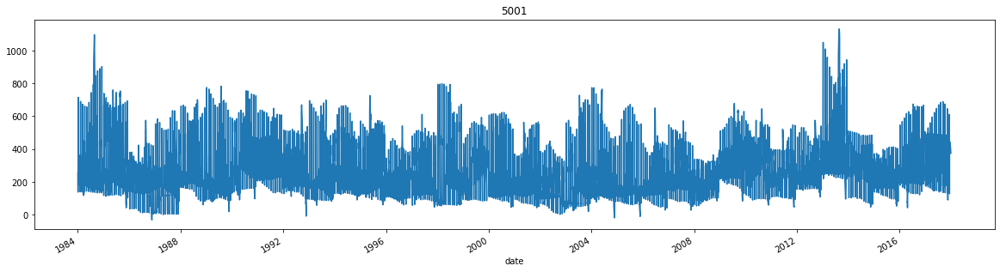

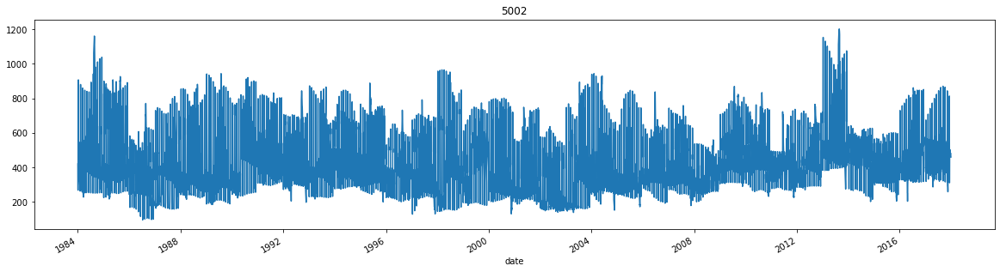

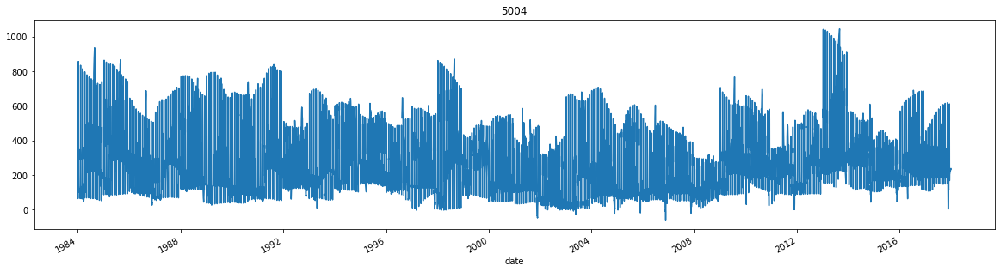

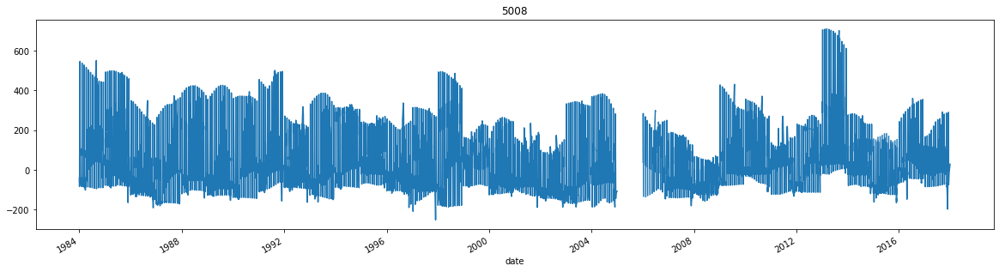

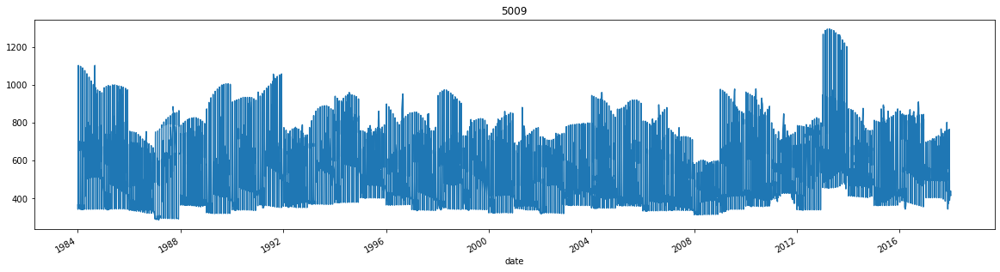

...

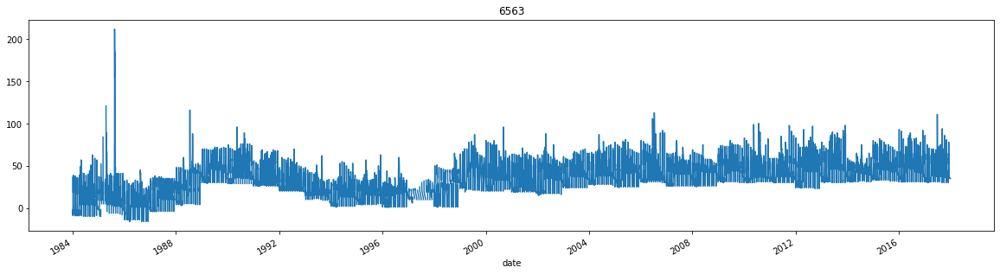

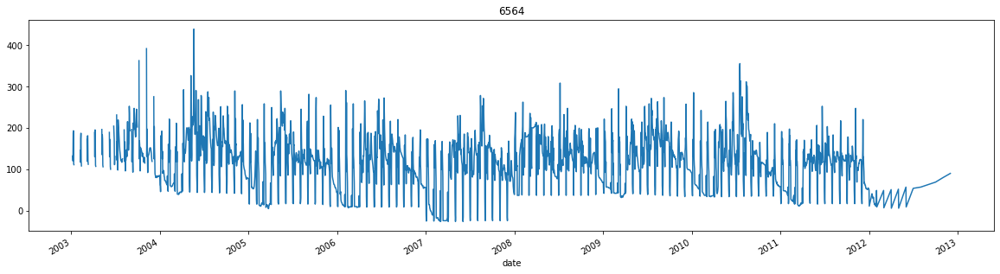

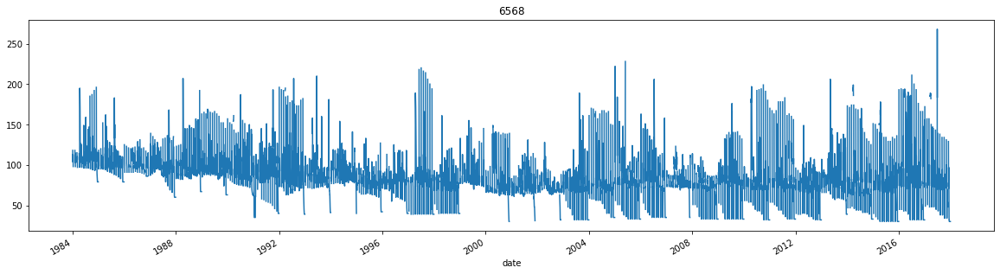

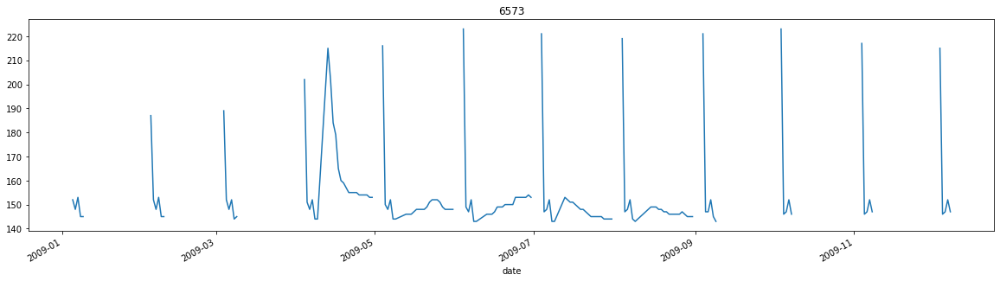

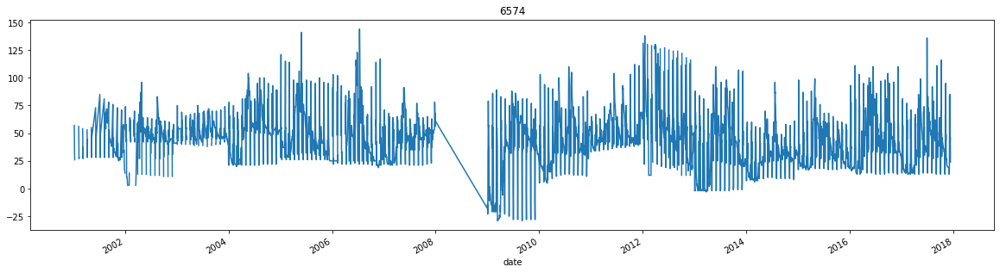

In [20]:
hydro = hydro.set_index('date')
cascade(hydro, 'avr_lev', 'id')
hydro = hydro.reset_index()

In [18]:
def restore_ts(data, nan_frac, ts_min_len, fill_lim=61):
    from scipy.stats import mode    
    
    restored_df = pd.DataFrame()
    df = data.copy()
    df = df.sort_index(level = [0, 1])
    uniq_id_lst = list(df.index.get_level_values(0).unique())
    
    for ID in tqdm.tqdm_notebook(uniq_id_lst):
        id_data_from_df = df[df.index.get_level_values(0).isin([ID])]
        
        for var in id_data_from_df.columns:
            
            if (id_data_from_df[var].isna().mean() > nan_frac)\
                or \
               (len(id_data_from_df[var].index) < (ts_min_len * 365))\
                or \
               (id_data_from_df[var].nunique() < 2):
                
                id_data_from_df[var] = id_data_from_df[var].fillna(0)
                
            else:
                
                if (id_data_from_df[var].nunique() >= 2)\
                    and \
                   (not {0, 1} >= set(data[var].unique()))\
                    and \
                   (id_data_from_df[var].dtype != 'O'): # если переменная непрерывная
                                                           
                    # замена nan на среднее за аналогичный период (день и месяц)
                    id_data_from_df[var] = id_data_from_df[var].fillna(id_data_from_df\
                                          .groupby([id_data_from_df.index.map(lambda x: x[1].month), \
                                                    id_data_from_df.index.map(lambda x: x[1].day)])[var].transform('mean'))
                    
                    # замена оставшихся nan на среднее между двумя соседними значениями
                    id_data_from_df[var] = id_data_from_df[var].interpolate(method='linear', limit = fill_lim)
                    
                    # замена nan по краям ряда (или того, что осталось)
                    id_data_from_df[var] = id_data_from_df[var].fillna(method='ffill')
                    id_data_from_df[var] = id_data_from_df[var].fillna(method='bfill')
                    
                elif (set(df[var].unique()).issuperset([0,1])): # если переменная бинарная       
                    
                    # замена nan на наиболее часто встречающееся значение за аналогичный период (день и месяц)
                    id_data_from_df[var] = id_data_from_df[var].fillna(id_data_from_df\
                                          .groupby([id_data_from_df.index.map(lambda x: x[1].month), \
                                                    id_data_from_df.index.map(lambda x: x[1].day)])[var]\
                                                                       .transform(lambda x: mode(x)[0][0]))
                    
                                       
                    # замена nan по краям ряда (или того, что осталось)
                    id_data_from_df[var] = id_data_from_df[var].fillna(method='ffill')
                    id_data_from_df[var] = id_data_from_df[var].fillna(method='bfill')
                    
                elif (df[var].dtype == 'O'): # если переменная категориальная
                    
                    id_data_from_df[var] = id_data_from_df[var]
                    
        restored_df = restored_df.append(id_data_from_df)
    
    return restored_df                    

In [19]:
restored_data_full = restore_ts(hydro_geo_meteo_ice, 0.5, 5)

In [21]:
restored_data_full.to_csv('restored_data.csv')

In [2]:
restored_data = pd.read_csv('restored_data.csv').set_index(['id', 'date'])
restored_data.index = restored_data.index.set_levels(pd.to_datetime(restored_data.index.levels[1]), level=1)
restored_data = restored_data.sort_index(level = [0, 1])
restored_data.head()

avr_lev  min_lev  max_lev  avr_wat_temp  KSVO_1  KSVO_10  \
id   date                                                                   
5001 1984-01-01    258.0    258.0    258.0      0.000000       0        0   
     1984-01-02    160.0    160.0    160.0      0.000000       0        0   
     1984-01-03    141.0    141.0    141.0      0.000000       0        0   
     1984-01-04    137.0    136.0    138.0      0.052174       0        0   
     1984-01-05    227.0    218.0    233.0      1.600000       0        0   

                 KSVO_11  KSVO_12  KSVO_13  KSVO_14  KSVO_15  KSVO_16  \
id   date                                                               
5001 1984-01-01        0        0        0        0        1        0   
     1984-01-02        0        0        0        0        1        0   
     1984-01-03        0        0        0        0        1        0   
     1984-01-04        0        0        0        0        1        0   
     1984-01-05        0        0        0        0        0        0   

                 KSVO_17  KSVO_18  KSVO_19  KSVO_2  KSVO_20  KSVO_21  KSVO_22  \
id   date                                                                       
5001 1984-01-01        0        0        0       0        0        0        0   
     1984-01-02        0        0        0       0        0        0        0   
     1984-01-03        0        0        0       0        0        0        0   
     1984-01-04        0        0        0       0        0        0        0   
     1984-01-05        0        0        0       0        0        0        0   

                 KSVO_23  KSVO_24  KSVO_25  KSVO_26  KSVO_27  KSVO_28  \
id   date                                                               
5001 1984-01-01        0        0        0        0        0        0   
     1984-01-02        0        0        0        0        0        0   
     1984-01-03        0        0        0        0        0        0   
     1984-01-04        1        0        0        0        0        0   
     1984-01-05        0        0        0        0        1        0   

                 KSVO_29  KSVO_3  KSVO_30  KSVO_31  KSVO_32  KSVO_33  KSVO_34  \
id   date                                                                       
5001 1984-01-01        0       1        0        0        0        0        0   
     1984-01-02        0       1        0        0        0        0        0   
     1984-01-03        0       0        0        0        0        0        0   
     1984-01-04        0       0        0        0        0        0        0   
     1984-01-05        0       0        0        0        0        0        0   

                 KSVO_35  KSVO_36  KSVO_37  KSVO_38  KSVO_39  KSVO_4  KSVO_40  \
id   date                                                                       
5001 1984-01-01        0        0        0        0        0       0        0   
     1984-01-02        0        0        0        0        0       0        0   
     1984-01-03        0        0        0        0        0       0        0   
     1984-01-04        0        0        0        0        0       0        0   
     1984-01-05        0        0        0        0        0       0        0   

                 KSVO_41  KSVO_42  KSVO_45  KSVO_46  KSVO_47  KSVO_48  \
id   date                                                               
5001 1984-01-01        0        0        0        0        0        0   
     1984-01-02        0        0        0        0        0        0   
     1984-01-03        0        0        0        0        0        0   
     1984-01-04        0        0        0        0        0        0   
     1984-01-05        0        0        0        0        0        0   

                 KSVO_49  KSVO_5  KSVO_51  KSVO_52  KSVO_6  KSVO_60  KSVO_7  \
id   date                                                                     
5001 1984-01-01        0       0        0        0       0        0       0   


### Создание новых переменных

In [5]:
# Dummy с месяцем
cols = restored_data.columns.tolist() + ['MONTH_' + str(i) for i in range(1, 13)]

data_plus_add = pd.DataFrame(np.hstack((restored_data, pd.get_dummies(restored_data.index.get_level_values(1).month))), \
                             columns = cols, index = restored_data.index)

data_plus_add = data_plus_add.drop(['MONTH_12'], axis=1)

# Dummy с сезоном
data_plus_add['winter'] = np.where(data_plus_add.index.get_level_values(1).month.isin([1,2,12]), 1, 0)
data_plus_add['spring'] = np.where(data_plus_add.index.get_level_values(1).month.isin([3,4,5]), 1, 0)
data_plus_add['summer'] = np.where(data_plus_add.index.get_level_values(1).month.isin([6,7,8]), 1, 0)

##### Новые переменные на основе целевой переменной

In [6]:
# Среднее, стандартное отклонение и медиана целевой переменной за месяц
data_plus_add['max_lev_month_mean'] = data_plus_add.groupby([data_plus_add.index.get_level_values(0),\
                                                             data_plus_add.index.get_level_values(1).month])\
                                                            ['avr_lev'].transform('mean')

data_plus_add['max_lev_month_std'] = data_plus_add.groupby([data_plus_add.index.get_level_values(0),\
                                                             data_plus_add.index.get_level_values(1).month])\
                                                            ['avr_lev'].transform('std')

data_plus_add['max_lev_month_median'] = data_plus_add.groupby([data_plus_add.index.get_level_values(0),\
                                                             data_plus_add.index.get_level_values(1).month])\
                                                            ['avr_lev'].transform('median')

In [7]:
# Среднее целевой переменной за месяц со сдвигами в 1 месяц и 1 год
data_plus_add['max_lev_month_mean_M_shift'] = data_plus_add.groupby([data_plus_add.index.get_level_values(0),\
                                                                     data_plus_add.index.get_level_values(1).month])\
                                                                    ['avr_lev'].transform('mean').shift()

data_plus_add['max_lev_month_mean_Y_shift'] = data_plus_add.groupby([data_plus_add.index.get_level_values(0),\
                                                                     data_plus_add.index.get_level_values(1).month])\
                                                                    ['avr_lev'].transform('mean').shift(12)

In [8]:
# Скользящее среднее целевой переменной за 7, 10, 15, 30 дней с лагом в 1 день
max_lev_rol_mean_7 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(7).mean().shift(1).reset_index(drop=True)
max_lev_rol_mean_7.index = data_plus_add.index
data_plus_add['max_lev_rol_mean_7_l1'] = max_lev_rol_mean_7

max_lev_rol_mean_10 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(10).mean().shift(1).reset_index(drop=True)
max_lev_rol_mean_10.index = data_plus_add.index
data_plus_add['max_lev_rol_mean_10_l1'] = max_lev_rol_mean_10

max_lev_rol_mean_15 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(15).mean().shift(1).reset_index(drop=True)
max_lev_rol_mean_15.index = data_plus_add.index
data_plus_add['max_lev_rol_mean_15_l1'] = max_lev_rol_mean_15

max_lev_rol_mean_30 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(30).mean().shift(1).reset_index(drop=True)
max_lev_rol_mean_15.index = data_plus_add.index
data_plus_add['max_lev_rol_mean_30_l1'] = max_lev_rol_mean_30

In [9]:
# Скользящее стандартное отклонение целевой переменной за 7, 10, 15, 30 дней с лагом в 1 день
max_lev_rol_std_7 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(7).std().shift(1).reset_index(drop=True)
max_lev_rol_std_7.index = data_plus_add.index
data_plus_add['max_lev_rol_std_7_l1'] = max_lev_rol_std_7

max_lev_rol_std_10 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(10).std().shift(1).reset_index(drop=True)
max_lev_rol_std_10.index = data_plus_add.index
data_plus_add['max_lev_rol_std_10_l1'] = max_lev_rol_std_10

max_lev_rol_std_15 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(15).std().shift(1).reset_index(drop=True)
max_lev_rol_std_15.index = data_plus_add.index
data_plus_add['max_lev_rol_std_15_l1'] = max_lev_rol_std_15

max_lev_rol_std_30 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(30).std().shift(1).reset_index(drop=True)
max_lev_rol_std_15.index = data_plus_add.index
data_plus_add['max_lev_rol_std_30_l1'] = max_lev_rol_std_30

In [10]:
# Скользящяя медиана целевой переменной за 7, 10, 15, 30 дней с лагом в 1 день
max_lev_rol_median_7_l1 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(7).median().shift(1).reset_index(drop=True)
max_lev_rol_median_7_l1.index = data_plus_add.index
data_plus_add['max_lev_rol_median_7_l1_l1'] = max_lev_rol_median_7_l1

max_lev_rol_median_10_l1 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(10).median().shift(1).reset_index(drop=True)
max_lev_rol_median_10_l1.index = data_plus_add.index
data_plus_add['max_lev_rol_median_10_l1'] = max_lev_rol_median_10_l1

max_lev_rol_median_15_l1 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(15).median().shift(1).reset_index(drop=True)
max_lev_rol_median_15_l1.index = data_plus_add.index
data_plus_add['max_lev_rol_median_15_l1_l1'] = max_lev_rol_median_15_l1

max_lev_rol_median_30_l1 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(30).median().shift(1).reset_index(drop=True)
max_lev_rol_median_15_l1.index = data_plus_add.index
data_plus_add['max_lev_rol_median_30_l1_l1'] = max_lev_rol_median_30_l1

In [11]:
# Скользящее среднее целевой переменной за 7, 10, 15, 30 дней с лагом в 30 дней
max_lev_rol_mean_7_l30 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(7).mean().shift(30).reset_index(drop=True)
max_lev_rol_mean_7_l30.index = data_plus_add.index
data_plus_add['max_lev_rol_mean_7_l30'] = max_lev_rol_mean_7_l30

max_lev_rol_mean_10_l30 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(10).mean().shift(30).reset_index(drop=True)
max_lev_rol_mean_10_l30.index = data_plus_add.index
data_plus_add['max_lev_rol_mean_10_l30'] = max_lev_rol_mean_10_l30

max_lev_rol_mean_15_l30 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(15).mean().shift(30).reset_index(drop=True)
max_lev_rol_mean_15_l30.index = data_plus_add.index
data_plus_add['max_lev_rol_mean_15_l30'] = max_lev_rol_mean_15_l30

max_lev_rol_mean_30_l30 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(30).mean().shift(30).reset_index(drop=True)
max_lev_rol_mean_15_l30.index = data_plus_add.index
data_plus_add['max_lev_rol_mean_30_l30'] = max_lev_rol_mean_30_l30

In [12]:
# Скользящее среднее целевой переменной за 7, 10, 15, 30 дней с лагом в 365 дней
max_lev_rol_mean_7_l365 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(7).mean().shift(365).reset_index(drop=True)
max_lev_rol_mean_7_l365.index = data_plus_add.index
data_plus_add['max_lev_rol_mean_7_l365'] = max_lev_rol_mean_7_l365

max_lev_rol_mean_10_l365 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(10).mean().shift(365).reset_index(drop=True)
max_lev_rol_mean_10_l365.index = data_plus_add.index
data_plus_add['max_lev_rol_mean_10_l365'] = max_lev_rol_mean_10_l365

max_lev_rol_mean_15_l365 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(15).mean().shift(365).reset_index(drop=True)
max_lev_rol_mean_15_l365.index = data_plus_add.index
data_plus_add['max_lev_rol_mean_15_l365'] = max_lev_rol_mean_15_l365

max_lev_rol_mean_30_l365 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(30).mean().shift(365).reset_index(drop=True)
max_lev_rol_mean_15_l365.index = data_plus_add.index
data_plus_add['max_lev_rol_mean_30_l365'] = max_lev_rol_mean_30_l365

In [13]:
# Скользящее стандартное отклонение целевой переменной за 7, 10, 15, 30 дней с лагом в 30 дней
max_lev_rol_std_7_l30 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(7).std().shift(30).reset_index(drop=True)
max_lev_rol_std_7_l30.index = data_plus_add.index
data_plus_add['max_lev_rol_std_7_l30'] = max_lev_rol_std_7_l30

max_lev_rol_std_10_l30 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(10).std().shift(30).reset_index(drop=True)
max_lev_rol_std_10_l30.index = data_plus_add.index
data_plus_add['max_lev_rol_std_10_l30'] = max_lev_rol_std_10_l30

max_lev_rol_std_15_l30 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(15).std().shift(30).reset_index(drop=True)
max_lev_rol_std_15_l30.index = data_plus_add.index
data_plus_add['max_lev_rol_std_15_l30'] = max_lev_rol_std_15_l30

max_lev_rol_std_30_l30 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(30).std().shift(30).reset_index(drop=True)
max_lev_rol_std_15_l30.index = data_plus_add.index
data_plus_add['max_lev_rol_std_30_l30'] = max_lev_rol_std_30_l30

In [14]:
# Скользящее стандартное отклонение целевой переменной за 7, 10, 15, 365 дней с лагом в 365 дней
max_lev_rol_std_7_l365 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(7).std().shift(365).reset_index(drop=True)
max_lev_rol_std_7_l365.index = data_plus_add.index
data_plus_add['max_lev_rol_std_7_l365'] = max_lev_rol_std_7_l365

max_lev_rol_std_10_l365 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(10).std().shift(365).reset_index(drop=True)
max_lev_rol_std_10_l365.index = data_plus_add.index
data_plus_add['max_lev_rol_std_10_l365'] = max_lev_rol_std_10_l365

max_lev_rol_std_15_l365 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(15).std().shift(365).reset_index(drop=True)
max_lev_rol_std_15_l365.index = data_plus_add.index
data_plus_add['max_lev_rol_std_15_l365'] = max_lev_rol_std_15_l365

max_lev_rol_std_365_l365 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(30).std().shift(365).reset_index(drop=True)
max_lev_rol_std_15_l365.index = data_plus_add.index
data_plus_add['max_lev_rol_std_365_l365'] = max_lev_rol_std_365_l365

In [15]:
# Скользящая медиана целевой переменной за 7, 10, 15, 30 дней с лагом в 30 дней
max_lev_rol_median_7_l30 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(7).median().shift(30).reset_index(drop=True)
max_lev_rol_median_7_l30.index = data_plus_add.index
data_plus_add['max_lev_rol_median_7_l30'] = max_lev_rol_median_7_l30

max_lev_rol_median_10_l30 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(10).median().shift(30).reset_index(drop=True)
max_lev_rol_median_10_l30.index = data_plus_add.index
data_plus_add['max_lev_rol_median_10_l30'] = max_lev_rol_median_10_l30

max_lev_rol_median_15_l30 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(15).median().shift(30).reset_index(drop=True)
max_lev_rol_median_15_l30.index = data_plus_add.index
data_plus_add['max_lev_rol_median_15_l30'] = max_lev_rol_median_15_l30

max_lev_rol_median_30_l30 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(30).median().shift(30).reset_index(drop=True)
max_lev_rol_median_15_l30.index = data_plus_add.index
data_plus_add['max_lev_rol_median_30_l30'] = max_lev_rol_median_30_l30

In [16]:
# Скользящая медиана целевой переменной за 7, 10, 15, 365 дней с лагом в 365 дней
max_lev_rol_median_7_l365 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(7).median().shift(365).reset_index(drop=True)
max_lev_rol_median_7_l365.index = data_plus_add.index
data_plus_add['max_lev_rol_median_7_l365'] = max_lev_rol_median_7_l365

max_lev_rol_median_10_l365 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(10).median().shift(365).reset_index(drop=True)
max_lev_rol_median_10_l365.index = data_plus_add.index
data_plus_add['max_lev_rol_median_10_l365'] = max_lev_rol_median_10_l365

max_lev_rol_median_15_l365 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(15).median().shift(365).reset_index(drop=True)
max_lev_rol_median_15_l365.index = data_plus_add.index
data_plus_add['max_lev_rol_median_15_l365'] = max_lev_rol_median_15_l365

max_lev_rol_median_365_l365 = data_plus_add.groupby(pd.Grouper(level='id'))\
                                            ['max_lev'].rolling(30).median().shift(365).reset_index(drop=True)
max_lev_rol_median_15_l365.index = data_plus_add.index
data_plus_add['max_lev_rol_median_365_l365'] = max_lev_rol_median_365_l365

In [35]:
# Первые разности целевой переменной
max_lev_diff = data_plus_add['max_lev'].reset_index(drop=True) - \
                            data_plus_add.groupby(pd.Grouper(level='id'))['max_lev'].shift(1).reset_index(drop=True)

max_lev_diff.index = data_plus_add.index

data_plus_add['max_lev_diff'] = max_lev_diff
data_plus_add = data_plus_add[data_plus_add['max_lev_diff'].isna() == False]

In [17]:
data_plus_add.head()

avr_lev  min_lev  max_lev  avr_wat_temp  KSVO_1  KSVO_10  \
id   date                                                                   
5001 1984-01-01    258.0    258.0    258.0      0.000000     0.0      0.0   
     1984-01-02    160.0    160.0    160.0      0.000000     0.0      0.0   
     1984-01-03    141.0    141.0    141.0      0.000000     0.0      0.0   
     1984-01-04    137.0    136.0    138.0      0.052174     0.0      0.0   
     1984-01-05    227.0    218.0    233.0      1.600000     0.0      0.0   

                 KSVO_11  KSVO_12  KSVO_13  KSVO_14  KSVO_15  KSVO_16  \
id   date                                                               
5001 1984-01-01      0.0      0.0      0.0      0.0      1.0      0.0   
     1984-01-02      0.0      0.0      0.0      0.0      1.0      0.0   
     1984-01-03      0.0      0.0      0.0      0.0      1.0      0.0   
     1984-01-04      0.0      0.0      0.0      0.0      1.0      0.0   
     1984-01-05      0.0      0.0      0.0      0.0      0.0      0.0   

                 KSVO_17  KSVO_18  KSVO_19  KSVO_2  KSVO_20  KSVO_21  KSVO_22  \
id   date                                                                       
5001 1984-01-01      0.0      0.0      0.0     0.0      0.0      0.0      0.0   
     1984-01-02      0.0      0.0      0.0     0.0      0.0      0.0      0.0   
     1984-01-03      0.0      0.0      0.0     0.0      0.0      0.0      0.0   
     1984-01-04      0.0      0.0      0.0     0.0      0.0      0.0      0.0   
     1984-01-05      0.0      0.0      0.0     0.0      0.0      0.0      0.0   

                 KSVO_23  KSVO_24  KSVO_25  KSVO_26  KSVO_27  KSVO_28  \
id   date                                                               
5001 1984-01-01      0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-02      0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-03      0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-04      1.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-05      0.0      0.0      0.0      0.0      1.0      0.0   

                 KSVO_29  KSVO_3  KSVO_30  KSVO_31  KSVO_32  KSVO_33  KSVO_34  \
id   date                                                                       
5001 1984-01-01      0.0     1.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-02      0.0     1.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-03      0.0     0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-04      0.0     0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-05      0.0     0.0      0.0      0.0      0.0      0.0      0.0   

                 KSVO_35  KSVO_36  KSVO_37  KSVO_38  KSVO_39  KSVO_4  KSVO_40  \
id   date                                                                       
5001 1984-01-01      0.0      0.0      0.0      0.0      0.0     0.0      0.0   
     1984-01-02      0.0      0.0      0.0      0.0      0.0     0.0      0.0   
     1984-01-03      0.0      0.0      0.0      0.0      0.0     0.0      0.0   
     1984-01-04      0.0      0.0      0.0      0.0      0.0     0.0      0.0   
     1984-01-05      0.0      0.0      0.0      0.0      0.0     0.0      0.0   

                 KSVO_41  KSVO_42  KSVO_45  KSVO_46  KSVO_47  KSVO_48  \
id   date                                                               
5001 1984-01-01      0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-02      0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-03      0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-04      0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-05      0.0      0.0      0.0      0.0      0.0      0.0   

                 KSVO_49  KSVO_5  KSVO_51  KSVO_52  KSVO_6  KSVO_60  KSVO_7  \
id   date                                                                     
5001 1984-01-01      0.0     0.0      0.0      0.0     0.0      0.0     0.0   


In [18]:
data_plus_add.to_csv('restored_data_plus_new_feats.csv')

In [38]:
totally_prep_data = pd.read_csv('restored_data_plus_new_feats.csv').set_index(['id', 'date'])
totally_prep_data.index = totally_prep_data.index.set_levels(pd.to_datetime(totally_prep_data.index.levels[1]), level=1)
totally_prep_data = totally_prep_data.sort_index(level = [0, 1])
totally_prep_data.head()

avr_lev  min_lev  max_lev  avr_wat_temp  KSVO_1  KSVO_10  \
id   date                                                                   
5001 1984-01-02    160.0    160.0    160.0      0.000000     0.0      0.0   
     1984-01-03    141.0    141.0    141.0      0.000000     0.0      0.0   
     1984-01-04    137.0    136.0    138.0      0.052174     0.0      0.0   
     1984-01-05    227.0    218.0    233.0      1.600000     0.0      0.0   
     1984-01-06    339.0    333.0    345.0     17.200000     0.0      0.0   

                 KSVO_11  KSVO_12  KSVO_13  KSVO_14  KSVO_15  KSVO_16  \
id   date                                                               
5001 1984-01-02      0.0      0.0      0.0      0.0      1.0      0.0   
     1984-01-03      0.0      0.0      0.0      0.0      1.0      0.0   
     1984-01-04      0.0      0.0      0.0      0.0      1.0      0.0   
     1984-01-05      0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-06      0.0      0.0      0.0      0.0      0.0      0.0   

                 KSVO_17  KSVO_18  KSVO_19  KSVO_2  KSVO_20  KSVO_21  KSVO_22  \
id   date                                                                       
5001 1984-01-02      0.0      0.0      0.0     0.0      0.0      0.0      0.0   
     1984-01-03      0.0      0.0      0.0     0.0      0.0      0.0      0.0   
     1984-01-04      0.0      0.0      0.0     0.0      0.0      0.0      0.0   
     1984-01-05      0.0      0.0      0.0     0.0      0.0      0.0      0.0   
     1984-01-06      0.0      0.0      0.0     0.0      0.0      0.0      0.0   

                 KSVO_23  KSVO_24  KSVO_25  KSVO_26  KSVO_27  KSVO_28  \
id   date                                                               
5001 1984-01-02      0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-03      0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-04      1.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-05      0.0      0.0      0.0      0.0      1.0      0.0   
     1984-01-06      0.0      0.0      0.0      0.0      0.0      0.0   

                 KSVO_29  KSVO_3  KSVO_30  KSVO_31  KSVO_32  KSVO_33  KSVO_34  \
id   date                                                                       
5001 1984-01-02      0.0     1.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-03      0.0     0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-04      0.0     0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-05      0.0     0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-06      1.0     0.0      0.0      0.0      0.0      0.0      0.0   

                 KSVO_35  KSVO_36  KSVO_37  KSVO_38  KSVO_39  KSVO_4  KSVO_40  \
id   date                                                                       
5001 1984-01-02      0.0      0.0      0.0      0.0      0.0     0.0      0.0   
     1984-01-03      0.0      0.0      0.0      0.0      0.0     0.0      0.0   
     1984-01-04      0.0      0.0      0.0      0.0      0.0     0.0      0.0   
     1984-01-05      0.0      0.0      0.0      0.0      0.0     0.0      0.0   
     1984-01-06      0.0      0.0      0.0      0.0      0.0     0.0      0.0   

                 KSVO_41  KSVO_42  KSVO_45  KSVO_46  KSVO_47  KSVO_48  \
id   date                                                               
5001 1984-01-02      0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-03      0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-04      0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-05      0.0      0.0      0.0      0.0      0.0      0.0   
     1984-01-06      0.0      0.0      0.0      0.0      0.0      0.0   

                 KSVO_49  KSVO_5  KSVO_51  KSVO_52  KSVO_6  KSVO_60  KSVO_7  \
id   date                                                                     
5001 1984-01-02      0.0     0.0      0.0      0.0     0.0      0.0     0.0   
